# Student grades prediction

### Project Description
The dataset contains grades scored by students throughout their university tenure in various courses and their CGPA calculated based on their grades

Columns Description-  total 43 columns

-Seat No : The enrolled number of candidate that took the exams

CGPA : The cumulative GPA based on the four year total grade progress of each candidate . CGPA is a Final Marks -- provided to student.
 
· All other columns are course codes in the format AB-XXX where AB are alphabets representing candidates' departments and XXX are numbers where first X represents the year the canditate took exam

 
Predict - CGPA of a student based on different grades in four years.


In [1]:
import warnings
warnings.simplefilter("ignore")
import missingno as ms   #for missing values visualization
import joblib

import pandas as pd
import numpy as np
import seaborn as sns    #for creating heatmap, time series plot, violin plots &so on
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats as stats
from scipy.stats import zscore

import scipy
import sklearn
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVC
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
import xgboost as xgb
import lightgbm as lgb

from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV 

In [2]:
import matplotlib.style as style   #for changing styles of plots
style.use("ggplot")
sns.set_style("whitegrid")
plt.rcParams["font.size"]=15
plt.rcParams["figure.figsize"]=(15,10)
plt.rcParams['figure.facecolor'] = 'xkcd:mint green'

# Read_csv

In [3]:
df=pd.read_csv("https://raw.githubusercontent.com/FlipRoboTechnologies/ML-Datasets/main/Grades/Grades.csv")
df

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,CS-97001,B-,D+,C-,C,C-,D+,D,C-,B-,...,C-,C-,C-,C-,A-,A,C-,B,A-,2.205
1,CS-97002,A,D,D+,D,B-,C,D,A,D+,...,D+,D,C,D,A-,B-,C,C,B,2.008
2,CS-97003,A,B,A,B-,B+,A,B-,B+,A-,...,B,B,A,C,A,A,A,A-,A,3.608
3,CS-97004,D,C+,D+,D,D,A-,D+,C-,D,...,D+,C,D+,C-,B-,B,C+,C+,C+,1.906
4,CS-97005,A-,A-,A-,B+,A,A,A-,B+,A,...,B-,B+,B+,B-,A-,A,A-,A-,A,3.448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,CS-97567,B,A,A,A-,A+,A,A-,A-,A+,...,A-,A-,A,A,A,B+,B+,B,A,3.798
567,CS-97568,A+,A,A,A,A,A,A,A-,A,...,B+,B+,A,A,A-,B,A-,C,A-,3.772
568,CS-97569,B,A,A-,B+,A,A,A,A,A,...,A-,B,A,B+,A,C,B+,A-,A-,3.470
569,CS-97570,A,B+,D,A,D,D+,B-,C-,B-,...,D,B,B,C-,D,C,B,B-,C,2.193


In [4]:
df1=df

In [5]:
df.head()

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,CS-97001,B-,D+,C-,C,C-,D+,D,C-,B-,...,C-,C-,C-,C-,A-,A,C-,B,A-,2.205
1,CS-97002,A,D,D+,D,B-,C,D,A,D+,...,D+,D,C,D,A-,B-,C,C,B,2.008
2,CS-97003,A,B,A,B-,B+,A,B-,B+,A-,...,B,B,A,C,A,A,A,A-,A,3.608
3,CS-97004,D,C+,D+,D,D,A-,D+,C-,D,...,D+,C,D+,C-,B-,B,C+,C+,C+,1.906
4,CS-97005,A-,A-,A-,B+,A,A,A-,B+,A,...,B-,B+,B+,B-,A-,A,A-,A-,A,3.448


In [6]:
df.tail()

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
566,CS-97567,B,A,A,A-,A+,A,A-,A-,A+,...,A-,A-,A,A,A,B+,B+,B,A,3.798
567,CS-97568,A+,A,A,A,A,A,A,A-,A,...,B+,B+,A,A,A-,B,A-,C,A-,3.772
568,CS-97569,B,A,A-,B+,A,A,A,A,A,...,A-,B,A,B+,A,C,B+,A-,A-,3.470
569,CS-97570,A,B+,D,A,D,D+,B-,C-,B-,...,D,B,B,C-,D,C,B,B-,C,2.193
570,CS-97571,C,D,D,C,C,D+,B,C+,C,...,C+,C,B-,D,F,C-,B+,D,C-,1.753


In [7]:
df.shape

(571, 43)

### Get general information about the dataset


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 571 entries, 0 to 570
Data columns (total 43 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Seat No.   571 non-null    object 
 1   PH-121     571 non-null    object 
 2   HS-101     571 non-null    object 
 3   CY-105     570 non-null    object 
 4   HS-105/12  570 non-null    object 
 5   MT-111     569 non-null    object 
 6   CS-105     571 non-null    object 
 7   CS-106     569 non-null    object 
 8   EL-102     569 non-null    object 
 9   EE-119     569 non-null    object 
 10  ME-107     569 non-null    object 
 11  CS-107     569 non-null    object 
 12  HS-205/20  566 non-null    object 
 13  MT-222     566 non-null    object 
 14  EE-222     564 non-null    object 
 15  MT-224     564 non-null    object 
 16  CS-210     564 non-null    object 
 17  CS-211     566 non-null    object 
 18  CS-203     566 non-null    object 
 19  CS-214     565 non-null    object 
 20  EE-217    

Except target column all the column are in object type. 

### find missing values in the dataset

In [9]:
x=df.isnull().sum()

In [10]:
y=df.isna().sum()

In [11]:
z=pd.DataFrame({"x":x,"y":y})
z['Difference'] = z['x'].subtract(z['y'])
print(z)

            x   y  Difference
Seat No.    0   0           0
PH-121      0   0           0
HS-101      0   0           0
CY-105      1   1           0
HS-105/12   1   1           0
MT-111      2   2           0
CS-105      0   0           0
CS-106      2   2           0
EL-102      2   2           0
EE-119      2   2           0
ME-107      2   2           0
CS-107      2   2           0
HS-205/20   5   5           0
MT-222      5   5           0
EE-222      7   7           0
MT-224      7   7           0
CS-210      7   7           0
CS-211      5   5           0
CS-203      5   5           0
CS-214      6   6           0
EE-217      6   6           0
CS-212      6   6           0
CS-215      6   6           0
MT-331      9   9           0
EF-303     10  10           0
HS-304     10  10           0
CS-301     10  10           0
CS-302     10  10           0
TC-383     10  10           0
MT-442     10  10           0
EL-332      9   9           0
CS-318      9   9           0
CS-306    

The above data indicates , there is no difference between "na" and "Null" values.

and there is missing values in the data set. lets handle it.

In [12]:
df["PH-121"].unique()

array(['B-', 'A', 'D', 'A-', 'B+', 'B', 'C+', 'C', 'C-', 'D+', 'WU', 'A+',
       'F'], dtype=object)

As this is a statement of grades so we will treat null values as absentees hence we will allot F grade for null values as CGPA is still calculated for those students.

In [13]:
df=df.fillna("F")

In [14]:
df.isna().sum()

Seat No.     0
PH-121       0
HS-101       0
CY-105       0
HS-105/12    0
MT-111       0
CS-105       0
CS-106       0
EL-102       0
EE-119       0
ME-107       0
CS-107       0
HS-205/20    0
MT-222       0
EE-222       0
MT-224       0
CS-210       0
CS-211       0
CS-203       0
CS-214       0
EE-217       0
CS-212       0
CS-215       0
MT-331       0
EF-303       0
HS-304       0
CS-301       0
CS-302       0
TC-383       0
MT-442       0
EL-332       0
CS-318       0
CS-306       0
CS-312       0
CS-317       0
CS-403       0
CS-421       0
CS-406       0
CS-414       0
CS-419       0
CS-423       0
CS-412       0
CGPA         0
dtype: int64

Hence no null values are present in dataset to analyse the CGPA

<AxesSubplot:>

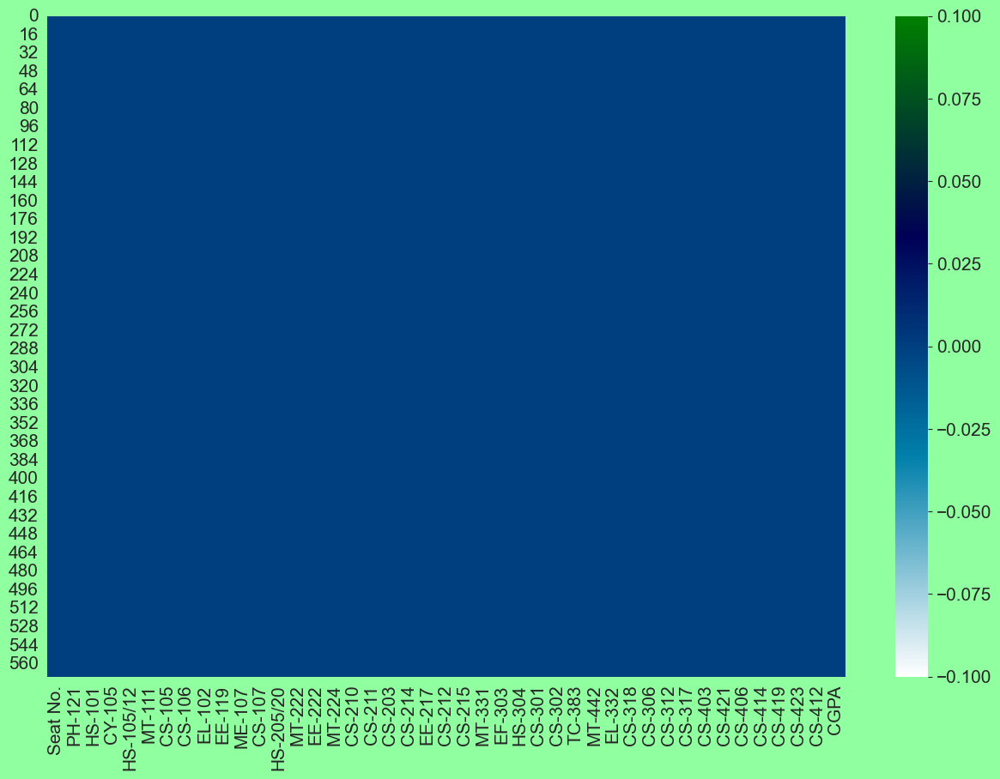

In [15]:
#cvisually showing missing values
sns.heatmap(df.isnull(), cmap='ocean_r')

In [16]:
#to find unique values present in the dataset
df.nunique()

Seat No.     571
PH-121        13
HS-101        12
CY-105        13
HS-105/12     13
MT-111        13
CS-105        11
CS-106        13
EL-102        13
EE-119        13
ME-107        13
CS-107        14
HS-205/20     13
MT-222        14
EE-222        13
MT-224        14
CS-210        14
CS-211        14
CS-203        13
CS-214        13
EE-217        13
CS-212        13
CS-215        14
MT-331        12
EF-303        12
HS-304        14
CS-301        12
CS-302        12
TC-383        12
MT-442        12
EL-332        13
CS-318        14
CS-306        13
CS-312        14
CS-317        12
CS-403        12
CS-421        13
CS-406        14
CS-414        13
CS-419        12
CS-423        12
CS-412        13
CGPA         491
dtype: int64

here, seat no. column has 571 rows and also this column not required to predict the CGPA

In [17]:
#LETS drop unnecessary column
df=df.drop(["Seat No."],axis=1)

In [18]:
#checking duplicated values

df.duplicated().sum()

0

### before proceding further analysis we need to convert string data into numerical data. becoz ML prediction analysis only read/need numerical data.  

In [19]:
from sklearn.preprocessing import OrdinalEncoder
oe=OrdinalEncoder()

In [20]:
df.iloc[:,:-1]=oe.fit_transform(df.iloc[:,:-1])

In [21]:
df

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,5.0,10.0,8.0,6.0,8.0,10.0,9.0,8.0,5.0,8.0,...,8.0,8.0,8.0,8.0,2.0,0.0,8.0,3.0,2.0,2.205
1,0.0,9.0,10.0,9.0,5.0,6.0,9.0,0.0,10.0,9.0,...,10.0,9.0,6.0,9.0,2.0,5.0,6.0,6.0,3.0,2.008
2,0.0,3.0,0.0,5.0,4.0,0.0,5.0,4.0,2.0,2.0,...,3.0,3.0,0.0,6.0,0.0,0.0,0.0,2.0,0.0,3.608
3,9.0,7.0,10.0,9.0,9.0,2.0,10.0,8.0,9.0,7.0,...,10.0,6.0,10.0,8.0,5.0,3.0,7.0,7.0,7.0,1.906
4,2.0,2.0,2.0,4.0,0.0,0.0,2.0,4.0,0.0,2.0,...,5.0,4.0,4.0,5.0,2.0,0.0,2.0,2.0,0.0,3.448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,3.0,0.0,0.0,2.0,1.0,0.0,2.0,2.0,1.0,4.0,...,2.0,2.0,0.0,0.0,0.0,4.0,4.0,3.0,0.0,3.798
567,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,...,4.0,4.0,0.0,0.0,2.0,3.0,2.0,6.0,2.0,3.772
568,3.0,0.0,2.0,4.0,0.0,0.0,0.0,0.0,0.0,3.0,...,2.0,3.0,0.0,4.0,0.0,6.0,4.0,2.0,2.0,3.470
569,0.0,4.0,9.0,0.0,9.0,10.0,5.0,8.0,5.0,8.0,...,9.0,3.0,3.0,8.0,9.0,6.0,3.0,5.0,6.0,2.193


In [22]:
df.describe()

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
count,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,...,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000
mean,3.781086,5.071804,2.917688,4.260946,3.928196,2.838879,4.154116,3.991243,3.919440,4.810858,...,4.246935,4.961471,3.663748,5.553415,4.323993,2.647986,4.061296,4.187391,4.294221,2.954888
std,3.046895,2.785317,2.981561,3.208027,3.015764,2.696709,2.754402,3.057621,2.693167,3.163269,...,3.457050,2.879800,3.128656,2.821944,3.705629,2.782226,2.592450,2.980919,3.534931,0.620552
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.800000
25%,2.000000,3.000000,0.000000,2.000000,2.000000,0.000000,2.000000,2.000000,2.000000,2.000000,...,1.000000,3.000000,1.000000,3.000000,2.000000,0.000000,2.000000,2.000000,2.000000,2.538000
50%,3.000000,5.000000,2.000000,4.000000,4.000000,2.000000,4.000000,4.000000,3.000000,5.000000,...,4.000000,5.000000,3.000000,5.000000,3.000000,2.000000,4.000000,4.000000,3.000000,3.029000
75%,6.000000,7.000000,5.000000,7.000000,6.000000,4.000000,6.000000,6.000000,6.000000,8.000000,...,7.000000,7.000000,6.000000,8.000000,7.000000,4.000000,5.000000,6.000000,6.000000,3.451000
max,12.000000,11.000000,12.000000,12.000000,12.000000,10.000000,12.000000,12.000000,12.000000,12.000000,...,13.000000,11.000000,11.000000,12.000000,13.000000,12.000000,11.000000,11.000000,12.000000,3.985000


From above points we see that-
1) There may be some skewness present in the data as mean and median(50%) has some difference between them but as its categorical data we will not remove it.
2) Standard deviation for each column.
3) There may be some outliers present as 75% and maximum values have a difference but again we will not remove them as its categorical data

## Correlation

In [23]:
df.corr()

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
PH-121,1.000000,0.382436,0.565781,0.507696,0.486108,0.609990,0.316341,0.441392,0.590282,0.547779,...,0.120731,0.498693,0.410585,0.373229,0.443387,0.257244,0.530977,0.191697,0.568114,-0.663135
HS-101,0.382436,1.000000,0.335341,0.474028,0.441725,0.400713,0.320990,0.359132,0.323289,0.345225,...,0.242666,0.371732,0.265502,0.336884,0.140012,0.260447,0.312083,0.265249,0.265127,-0.537170
CY-105,0.565781,0.335341,1.000000,0.513804,0.551314,0.587696,0.398464,0.461587,0.500810,0.484401,...,0.359239,0.532915,0.577793,0.464361,0.225834,0.181554,0.545839,0.254401,0.347033,-0.669816
HS-105/12,0.507696,0.474028,0.513804,1.000000,0.502434,0.492788,0.512453,0.369392,0.424599,0.333695,...,0.324957,0.511731,0.511119,0.478193,0.196240,0.232226,0.518484,0.307307,0.269522,-0.626721
MT-111,0.486108,0.441725,0.551314,0.502434,1.000000,0.414055,0.523429,0.563668,0.419849,0.477460,...,0.525378,0.579642,0.488315,0.571791,0.139136,0.316264,0.557069,0.465576,0.240939,-0.754021
CS-105,0.609990,0.400713,0.587696,0.492788,0.414055,1.000000,0.307563,0.374514,0.522398,0.464715,...,0.130736,0.420289,0.362033,0.315126,0.390064,0.222983,0.381599,0.135145,0.446123,-0.613169
CS-106,0.316341,0.320990,0.398464,0.512453,0.523429,0.307563,1.000000,0.360123,0.301324,0.313438,...,0.509483,0.453052,0.504190,0.461192,0.046665,0.212901,0.486369,0.403949,0.125788,-0.560423
EL-102,0.441392,0.359132,0.461587,0.369392,0.563668,0.374514,0.360123,1.000000,0.461803,0.487033,...,0.377792,0.510218,0.403340,0.447677,0.133412,0.350020,0.463966,0.456172,0.270819,-0.666859
EE-119,0.590282,0.323289,0.500810,0.424599,0.419849,0.522398,0.301324,0.461803,1.000000,0.575850,...,0.214504,0.470555,0.409454,0.413542,0.362994,0.292626,0.513312,0.312852,0.441268,-0.668793
ME-107,0.547779,0.345225,0.484401,0.333695,0.477460,0.464715,0.313438,0.487033,0.575850,1.000000,...,0.262890,0.499925,0.413866,0.415823,0.285714,0.257346,0.508011,0.306103,0.422639,-0.676874


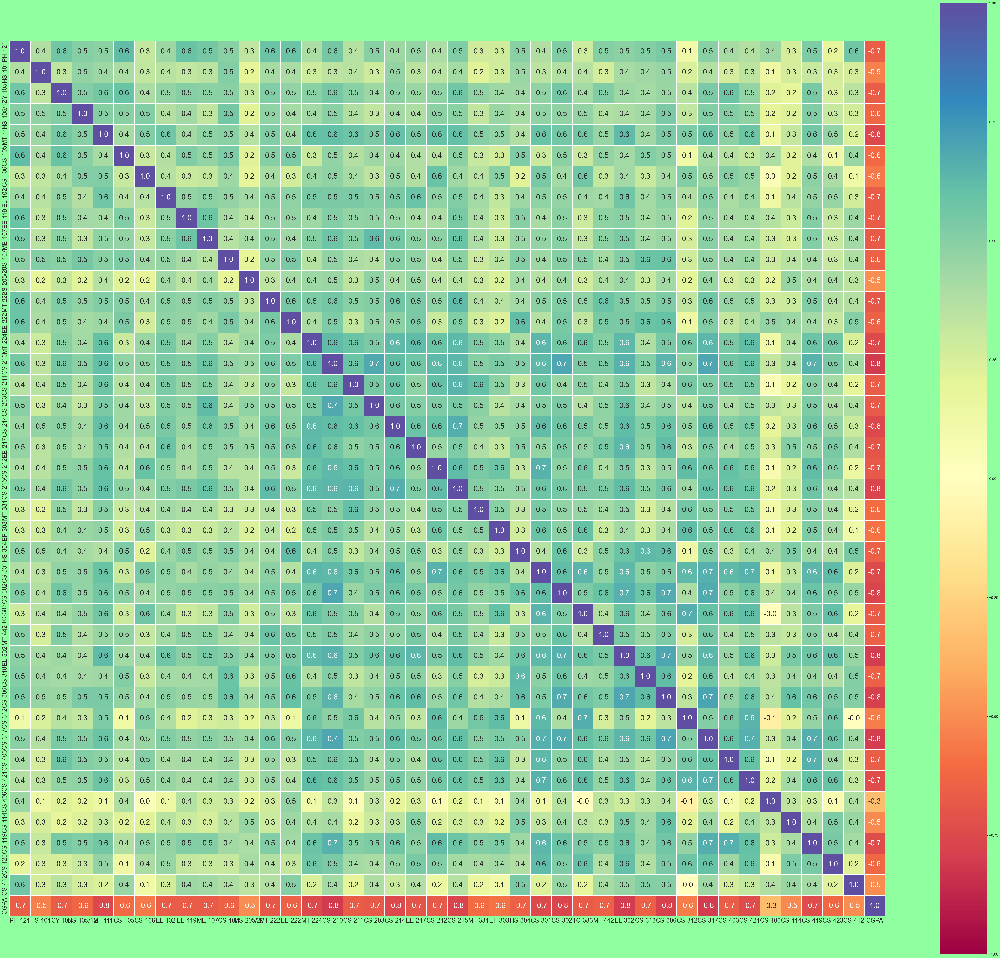

In [24]:
lower_triangle = np.tril(df.corr())
plt.figure(figsize=(80,70))
sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True, square=True, fmt='0.1f', 
            annot_kws={'size':30}, cmap="Spectral",linewidth=1)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.show()

# Data analysis

### Univariate analysis

<AxesSubplot:xlabel='PH-121', ylabel='count'>

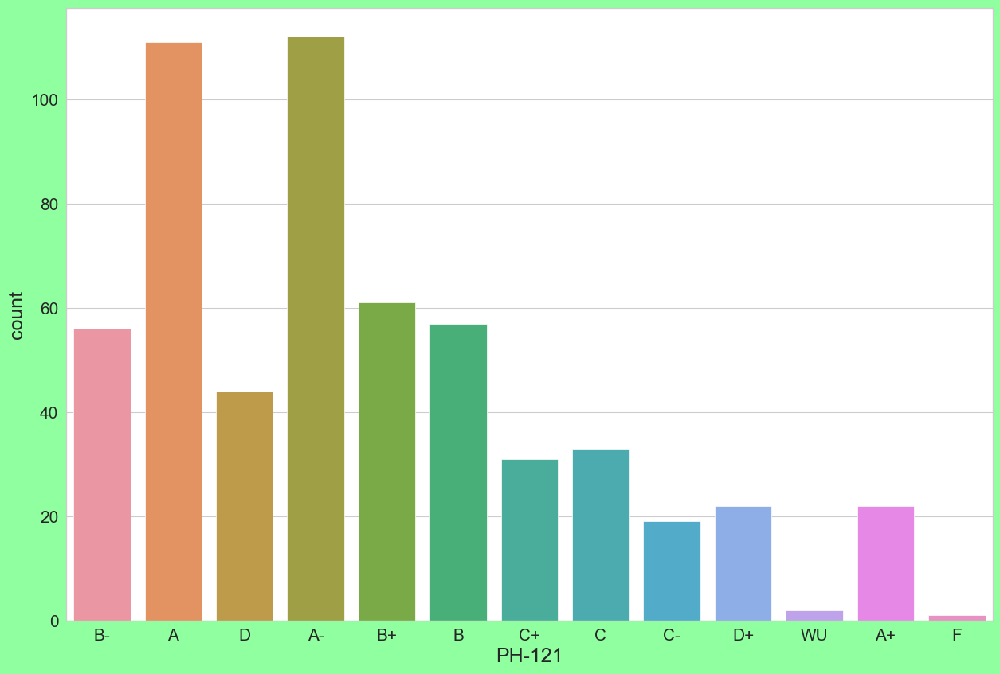

In [25]:
sns.countplot(x=df1['PH-121'])

From above we see that most students got A and A- in the subject PH-121

In [26]:
df1=df1.drop(["Seat No."],axis=1)

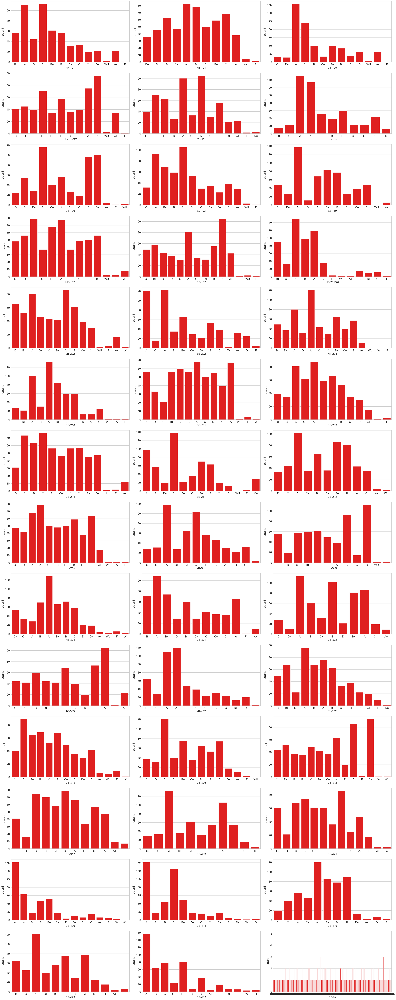

In [27]:
#lets check how the data has presented in the column
#(only for int and float datatypes)

plt.figure(figsize = (30,80), facecolor = "white")
plotnumber = 1
for col in df1:
    if plotnumber <=42:
        ax=plt.subplot(15,3, plotnumber)
        sns.countplot(df1[col],color="r")
        plt.xlabel(col,fontsize = 15)
    plotnumber += 1
plt.tight_layout()

# Multivariate Analysis

used to considering,more than two columns for the analysis purpose.

In [28]:
sns.pairplot(data=df)
plt.show()

due to high column range multivariate analysis is not visually clear.

<AxesSubplot:ylabel='CGPA'>

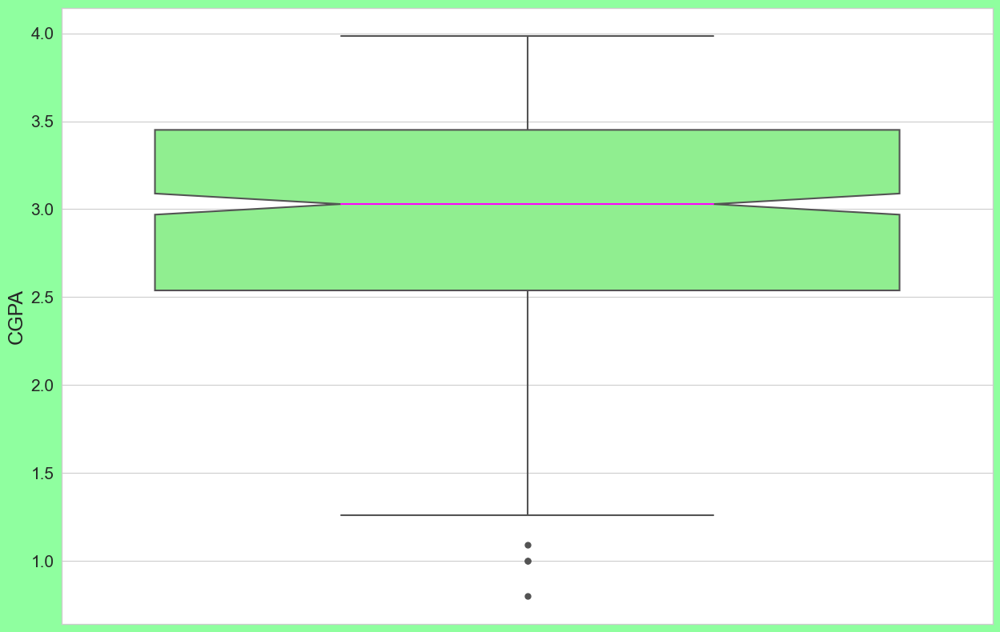

In [29]:
sns.boxplot(y=df['CGPA'],notch=True,flierprops={"marker": "o"},boxprops={"facecolor":'lightgreen'},
    medianprops={"color": "magenta"})

From above we can see the Maximum, minimum and the median CGPA 

Now we will scale the data and skip the steps of removing outliers and skewness as its categorical data

## Scaling

Does scaling reduce outliers?
One key aspect of feature engineering is scaling, normalization, and standardization, which involves transforming the data to make it more suitable for modeling. These techniques can help to improve model performance, reduce the impact of outliers, and ensure that the data is on the same scale.

In [30]:
#splitting the data
x=df.drop(['CGPA'],axis=1)
y=df['CGPA']
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
scaled_x = sc.fit_transform(x)
scaled_x

array([[ 0.40040198,  1.77089951,  1.7060756 , ...,  1.52063004,
        -0.39867967, -0.6495833 ],
       [-1.24205154,  1.4115592 ,  2.37745339, ...,  0.74848264,
         0.60860392, -0.36644432],
       [-1.24205154, -0.74448263, -0.97943555, ..., -1.56795956,
        -0.73444087, -1.21586126],
       ...,
       [-0.25657943, -1.82250355, -0.30805776, ..., -0.02366476,
        -0.73444087, -0.6495833 ],
       [-1.24205154, -0.38514232,  2.0417645 , ..., -0.40973846,
         0.27284273,  0.48297262],
       [ 0.72889268,  1.4115592 ,  2.0417645 , ..., -0.02366476,
         1.61588752,  1.04925058]])

## Checking multicollinearity using VIF

In [31]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = x.columns
vif['vif'] = [variance_inflation_factor(scaled_x,i) for i in range(scaled_x.shape[1])]
vif

,Features,vif
0,PH-121,3.100907
1,HS-101,1.802546
2,CY-105,2.631815
3,HS-105/12,2.318844
4,MT-111,2.712395
5,CS-105,2.462047
6,CS-106,2.046631
7,EL-102,2.147065
8,EE-119,2.181118
9,ME-107,2.383498


As no value is more than 10 so all the values are in acceptable range and thus there is no multicollinearity present

We can see that every column is in the acceptable range

## Fitting the models now


In [32]:
maxAcc = 0
maxRS = 0

for i in range(1,50):
    x_train,x_test,y_train,y_test = train_test_split(scaled_x,y,test_size = .25, random_state=i)
    lr = LinearRegression()
    lr.fit(x_train,y_train)
    pred = lr.predict(x_test)
    acc = r2_score(y_test,pred)
    if acc>maxAcc:
        maxAcc = acc
        maxRs=i
print("Best Accuracy is:", maxAcc, "on Random State:", maxRs)

Best Accuracy is: 0.9773118807513144 on Random State: 23


So the best random state is 23

In [33]:
x_train,x_test,y_train,y_test=train_test_split(scaled_x,y,test_size=0.25,random_state=23)

In [34]:
models=[LinearRegression(),RandomForestRegressor(),KNeighborsRegressor(),DecisionTreeRegressor(), SVR()]

In [35]:
for m in models:
    m.fit(x_train,y_train)
    mpred=m.predict(x_test)
    print('For',m)
    print("R2 score :",r2_score(y_test, mpred))
    print("Mean absolute error: ", mean_absolute_error(y_test,mpred))
    print("Mean squared error: ", mean_squared_error(y_test,mpred),'\n')

For LinearRegression()
R2 score : 0.9773118807513144
Mean absolute error:  0.07415040250914927
Mean squared error:  0.009542641941722474 

For RandomForestRegressor()
R2 score : 0.9517785486898162
Mean absolute error:  0.10828699300699292
Mean squared error:  0.02028198277342653 

For KNeighborsRegressor()
R2 score : 0.9635157288765976
Mean absolute error:  0.09399300699300693
Mean squared error:  0.015345314965034955 

For DecisionTreeRegressor()
R2 score : 0.8632460515043511
Mean absolute error:  0.17744055944055942
Mean squared error:  0.05751882517482517 

For SVR()
R2 score : 0.9770135518931524
Mean absolute error:  0.07061676300913619
Mean squared error:  0.009668119309111033 



# Cross Validation

In [36]:
for m in models:
    cvs=cross_val_score(m,scaled_x,y)
    print('For',m,'\n',cvs)
    print(cvs.mean(),'\n')

For LinearRegression() 
 [0.95916971 0.88123024 0.96119751 0.95812176 0.95357477]
0.9426587975167289 

For RandomForestRegressor() 
 [0.95461088 0.88127178 0.95734746 0.9386808  0.93611587]
0.9336053602447644 

For KNeighborsRegressor() 
 [0.95325724 0.86776504 0.95809864 0.95978154 0.9397712 ]
0.9357347337189326 

For DecisionTreeRegressor() 
 [0.81420273 0.74647197 0.89484421 0.7885272  0.73967374]
0.7967439708361244 

For SVR() 
 [0.97398697 0.94843346 0.96808077 0.96101511 0.95765283]
0.9618338295007822 



So our best model is SV Regression

We will now save it using joblib and in a user defined function for prediction

In [37]:
svr=SVR()
final_model=svr.fit(x_train, y_train)
fmod_pred = svr.predict(x_test)
fmod_acc = (r2_score(y_test, fmod_pred))*100
print('Accuracy of our best model is:',fmod_acc)

Accuracy of our best model is: 97.70135518931524


In [38]:
def studentsgrade(x):
    
    array=np.asarray(x)

    reshaped=array.reshape(1,-1)
    
    values=oe.transform(reshaped)

    prediction=svr.predict(values)

    print("The CGPA for this student is ",prediction[0])

In [39]:
studentsgrade(['B','C','B+','A','A+','A','A','A+','A+','B+','A+','A','A','A','C','D','C','B','F','B','C','A','C','A','C','A','A','A','A','F','C','B','A','A','A','C','B','D','C','B','C'])

The CGPA for this student is  2.684585122683154


## SAVING THE MODEL

In [40]:
import joblib
joblib.dump(final_model,'Student grade prediction.pkl')

['Student grade prediction.pkl']

In [41]:
#BULDING THE PREDICTION SYSTEM
input_data = ('B+','C','A-','C-','A-','B+','A-','A-','A','A','B+','A','A-','A','A-','A-','A-','A','B+','A-','B+','A','A-','C-','B','A-','B+','B','A-','A','B','B-','C','B+','A-','B+','A-','A+','A-','A-','A')
input_data_array = np.asarray(input_data)

#reshaping the data so that it works for only one instance at a time
input_data_reshaped = input_data_array.reshape(1,-1)
values=oe.transform(input_data_reshaped)
prediction = final_model.predict(values)
print("Predicted passenger data:",str(prediction))

Predicted passenger data: [2.67003193]


In [42]:
#THANK YOU